# Анимация в Jupyter Notebook с matplotlib и plotly

## matplotlib

Прекрасно анимируется в ванильном jupyter notebook, в pycharm и в обычной программе

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

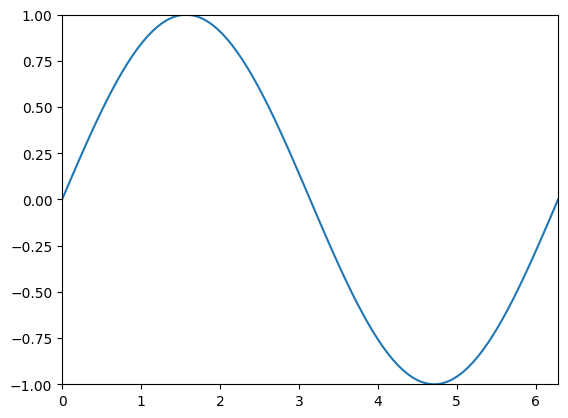

In [6]:
# Создаем данные
x = np.linspace(0, 2 * np.pi, 100)

# Создаем фигуру и оси
fig, ax = plt.subplots()
line, = ax.plot(x, np.sin(x))

# Устанавливаем пределы для осей
ax.set_xlim(0, 2 * np.pi)
ax.set_ylim(-1, 1)


# Функция для обновления кадров
def update(frame):
    # Должна обновить/изменить один или несколько артистов (элементов, из которых состоит график - точки для scater, текст подписи и пр.) и вернуть их
    line.set_ydata(np.sin(x + frame * 0.1))  # Смещаем синусоиду
    return line,


# Создаем объект анимации.
# frames=100 - кадров
# interval=50 - 50 миллисекунд задержка между кадрами.
# переменную нужно создавать, чтобы хранилась анимация. Даже если она не используется дальше явно
ani = FuncAnimation(fig, update, frames=100, interval=50)

# Встраиваем анимацию в Jupyter Notebook
HTML(ani.to_jshtml())
# HTML_output = HTML(ani.to_jshtml())
# HTML_output

# Или показываем график если не в среде notebook, HTML(ani.to_jshtml()) не нужен
# plt.show()

## plotly

В отличии от matplotlib `fig.show()` всегда открывается только в броузере (или в Pycharm, что объяснимо)

Что печально - сразу создаются наборы данных для каждого фрейма анимации. Программировать проще, но очень расточительно по ресерсам. matplotlib вычисляет данные для анимации динамически, по мере запроса

In [3]:
import numpy as np
import pandas as pd
import plotly.express as px

# Создаем данные
x = np.linspace(0, 2 * np.pi, 100)
frames = 50
data = []

for frame in range(frames):
    phase = frame * 0.1  # Смещение фазы
    y = np.sin(x + phase)
    data.append(pd.DataFrame({"x": x, "y": y, "frame": frame}))

# Соединяем данные в один DataFrame
df = pd.concat(data)

# Создаем анимацию
fig = px.line(df, x="x", y="y", animation_frame="frame", title="Анимация синусоиды")

# отображаем график в Jupyter Notebook
fig.show()